In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import scienceplots
plt.rcParams.update(plt.rcParamsDefault)
plt.style.use(['science','no-latex','ieee'])
import geopandas as gpd
from collections import Counter
import numpy as np
from tqdm import tqdm

In [2]:
##extraction of human fatality
#df1 = pd.read_csv("../Data/IndiaFloodInventory.csv")

#for i in range(0,len(df1)):
#    district_series = str(df1['Districts'][i])
#    district_series = pd.Series(district_series.split(', ')).str.strip()
#    district_series = district_series.str.split(' ,').explode().str.strip()
#    district_series = district_series.str.split(',').explode().str.strip()
#    district_series = district_series.str.split('and ').explode().str.strip()
#    district_df = district_series.value_counts()
#
#    # Check if the district exists in the value counts
#    if df1['Human fatality'][i] != 0 and len(district_df) is not None:
#        aa =  (df1['Human fatality'][i]) / len(district_df)
#        df1.at[i, 'HF_pd'] = aa
#    else:
#        # Handle the case where the district does not exist in the value counts or Human fatality is 0
#        df1.at[i, 'HF_pd'] = 0
#
#    # Check if the district exists in the value counts
#    if df1['Human injured'][i] != 0 and len(district_df) is not None:
#        bb =  (df1['Human injured'][i]) / len(district_df)
#        df1.at[i, 'HI_pd'] = bb
#    else:
#        # Handle the case where the district does not exist in the value counts or Human fatality is 0
#        df1.at[i, 'HI_pd'] = 0        

In [3]:
df = pd.read_csv("../Data/IndiaFloodInventory.csv")


In [4]:
df

,Unnamed: 0,UEI,Start Date,End Date,Duration(Days),Main Cause,Location,Districts,State,Latitude,...,Severity,Area Affected,Human fatality,Human injured,Human Displaced,Animal Fatality,Description of Casualties/injured,Extent of damage,Event Source,Event Souce ID
0,563,UEI-IMD-FL-1967-0001,02/07/67 00:00,08/07/67 00:00,7.0,flood,NaN,NaN,Assam,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IMD,NaN
1,564,UEI-IMD-FL-1967-0002,22/07/67 00:00,28/07/67 00:00,7.0,flood,NaN,NaN,"Maharastra, Gujarat",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IMD,NaN
2,565,UEI-IMD-FL-1967-0003,01/08/67 00:00,30/08/67 00:00,30.0,flood,NaN,NaN,Uttar Pradesh,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IMD,NaN
3,566,UEI-IMD-FL-1967-0004,08/09/67 00:00,09/09/67 00:00,2.0,flood,NaN,"Bhadrak, Dhenkanal, Jajapur, Subarnapur, Nuapa...","Odisha, Bihar, Uttar Pradesh, Madhya Pradesh, ...",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Marooning of Barwer Express,IMD,NaN
4,567,UEI-IMD-FL-1968-0001,22/06/68 00:00,28/06/68 00:00,7.0,flood,NaN,NaN,Assam,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Affecting about one million people,an area of ...",IMD,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6871,7434,UEI-IMD-FL-2023-0649,10/09/23 00:00,11/09/23 00:00,2.0,Heavy Rains & Floods,NaN,Rampur,Uttar Pradesh,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IMD,NaN
6872,7435,UEI-IMD-FL-2023-0650,10/09/23 00:00,11/09/23 00:00,2.0,Heavy Rains & Floods,NaN,Sambhal,Uttar Pradesh,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IMD,NaN
6873,7436,UEI-IMD-FL-2023-0651,10/09/23 00:00,11/09/23 00:00,2.0,Heavy Rains & Floods,NaN,Sitapur,Uttar Pradesh,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IMD,NaN
6874,7437,UEI-IMD-FL-2023-0652,10/09/23 00:00,11/09/23 00:00,2.0,Heavy Rains & Floods,NaN,Sultanpur,Uttar Pradesh,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IMD,NaN


In [5]:
df.set_index('Start Date',inplace=True)
df.index = pd.to_datetime(df.index)
df = df.loc['1967-01-01':'2023-12-31']
state_series = df['State']

/var/tmp/pbs.74526.pbshpc/ipykernel_27831/3719743704.py:3: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  df = df.loc['1967-01-01':'2023-12-31']


In [6]:
state_series = state_series.str.split(', ').explode().str.strip()
state_series = state_series.str.replace("East Rajasthan", "Rajasthan")
state_series = state_series.str.replace("Parts of Maharastra", "Maharashtra")
state_series = state_series.str.replace("New Delhi", "Delhi")
state_series = state_series.str.replace("Dadru and Nagar Haveli", "Dadar and Nagar Haveli")
state_series = state_series.str.replace("Dadar and Nagar Haveli", "Daman and Diu")
state_series = state_series.str.replace("Daman and Diu", "DH & DD")
state_series = state_series.str.replace("Shimla", "Himachal Pradesh")
state_series = state_series.str.replace("Madras", "Tamil Nadu")
state_series = state_series.str.replace("Jammu & Kashmir", "Jammu and Kashmir")
state_series = state_series.str.replace("Andaman & Nicobar Islands", "Andaman & Nicobar")
state_series = state_series.str.replace("Pondicherry", "Puducherry")
state_series = state_series.str.replace("Uttar pradesh", "Uttar Pradesh")
state_series = state_series.str.replace("Tamil Nadu", "Tamilnadu")

In [7]:
state_df = state_series.value_counts()
state_df = state_df.to_frame()
state_df.reset_index(level=0, inplace=True)
state_df.columns = ['State', 'Count'] 

In [8]:
fp = "../Data/shapefiles/States/Admin2.shp"
map_df = gpd.read_file(fp)                          # Reads the shape file of India for plotting purpose
map_df_copy = gpd.read_file(fp)


In [9]:
merged = map_df.set_index('ST_NM').join(state_df.set_index('State'))
merged['Count'] = merged['Count'].replace(np.nan, 0)

In [10]:
import pandas as pd
import numpy as np
map_df['ST_NM'] = map_df['ST_NM'].str.lower()
map_df.set_index('ST_NM', inplace=True)
state_df['State'] = state_df['State'].str.lower()
state_df.set_index('State', inplace=True)
merged = map_df.join(state_df)
merged['Count'] = merged['Count'].replace(np.nan, 0)

/home/civil/phd/cez218606/anaconda3/envs/geo_env/lib/python3.10/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


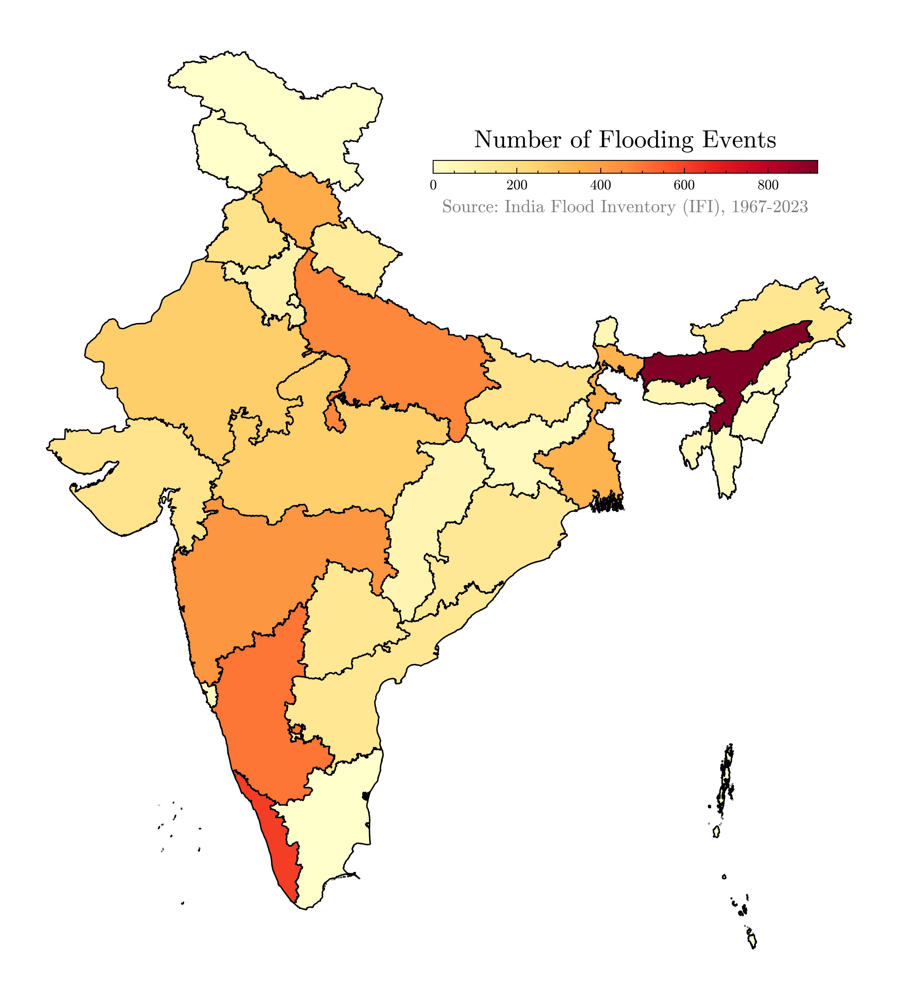

In [11]:

import scienceplots
plt.style.use(['science','no-latex','bright'])

fig, ax = plt.subplots(1, figsize=(10, 10),dpi=400, facecolor='white')
ax.axis('off')
#ax.set_title('India Flood Inventory [1967-2023]', fontdict={'fontsize': '20', 'fontweight' : '10'}, loc='left')

# Plot the figure
plot = merged.plot(column='Count',cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0', \
            legend=False,markersize=[39.739192, -104.990337], legend_kwds={'label': "Number of Flooding Events"})

cax = fig.add_axes([0.5, 0.75, 0.3, 0.01])  # Adjust the coordinates and size as needed
sm = plt.cm.ScalarMappable(cmap='YlOrRd',norm=plt.Normalize(vmin=0, vmax=919))
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label("Number of Flooding Events",labelpad = -35, size=14)

#subtitle1 = 'Figure Source: HydroSense Lab, IIT Delhi.'
subtitle2 = 'Source: India Flood Inventory (IFI), 1967-2023'

#plt.text(0.25, 0.12, subtitle1, fontsize=12, color='gray', transform=plt.gcf().transFigure)
plt.suptitle(subtitle2, fontsize=10, color='gray', y=0.73, x=0.65)

plt.savefig('../output/Figures/State_Number_of_Flooding_Events.png',format = 'png', dpi=400)
plt.show()

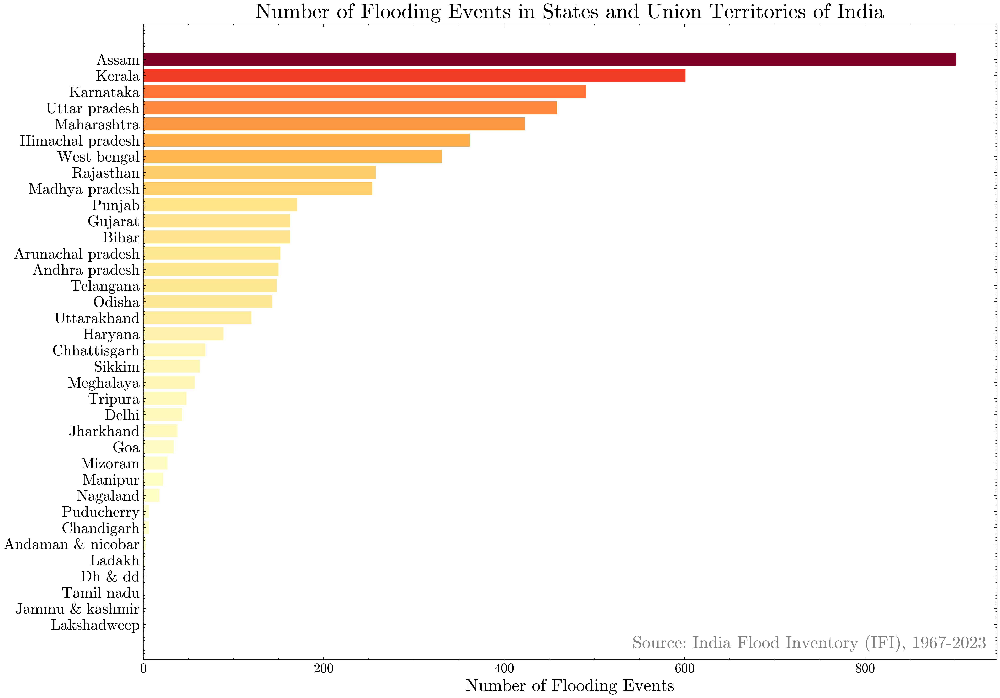

In [12]:
import matplotlib.pyplot as plt
import geopandas as gpd


# Sort the GeoDataFrame by 'Count' in descending order to create the bar graph
merged = merged.sort_values(by='Count', ascending=True)

# Extract state names and counts
state_names = merged.index
state_names = state_names.str.replace("dadra and nagar haveli and daman and diu", "DH & DD")
state_names = state_names.str.capitalize()
counts = merged['Count']

plt.figure(figsize=(16, 12),dpi=400, facecolor='white')
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(value / max(counts)) for value in counts]
bars = plt.barh(state_names, counts, color=colors)
plt.xticks(fontsize=14)
plt.yticks(fontsize=16)

plt.xlabel('Number of Flooding Events',size=18)

#plt.ylabel('State')
plt.title('Number of Flooding Events in States and Union Territories of India',size=22)
subtitle2 = 'Source: India Flood Inventory (IFI), 1967-2023'
plt.suptitle(subtitle2, fontsize=18, color='gray', y=0.14, x=0.73)

# Show the plot
plt.savefig('../output/Figures/State_Number_of_Flooding_Events_Bar.png',format = 'png', dpi=400)
plt.show()



In [13]:
district_series=df['Districts']

district_series = district_series.str.split(', ').explode().str.strip()
district_series = district_series.str.split(' ,').explode().str.strip()
district_series = district_series.str.split(',').explode().str.strip()
district_series = district_series.str.split('and ').explode().str.strip()

district_df = district_series.value_counts()

district_df = district_df.to_frame()
district_df.reset_index(level=0, inplace=True)
district_df.columns = ['Districts', 'Count'] 

In [14]:
district_df.head()

,Districts,Count
0,Thiruvananthapuram,229
1,Lakhimpur,213
2,Dhemaji,197
3,Kamrup,176
4,Nagaon,173


In [15]:
district_df[:29]

,Districts,Count
0,Thiruvananthapuram,229
1,Lakhimpur,213
2,Dhemaji,197
3,Kamrup,176
4,Nagaon,173
5,Mumbai,170
6,Barpeta,160
7,Nagpur,155
8,Sonitpur,154
9,Dibrugarh,150


In [16]:
district_df.to_csv('../output/district_Flooding_Events.csv')

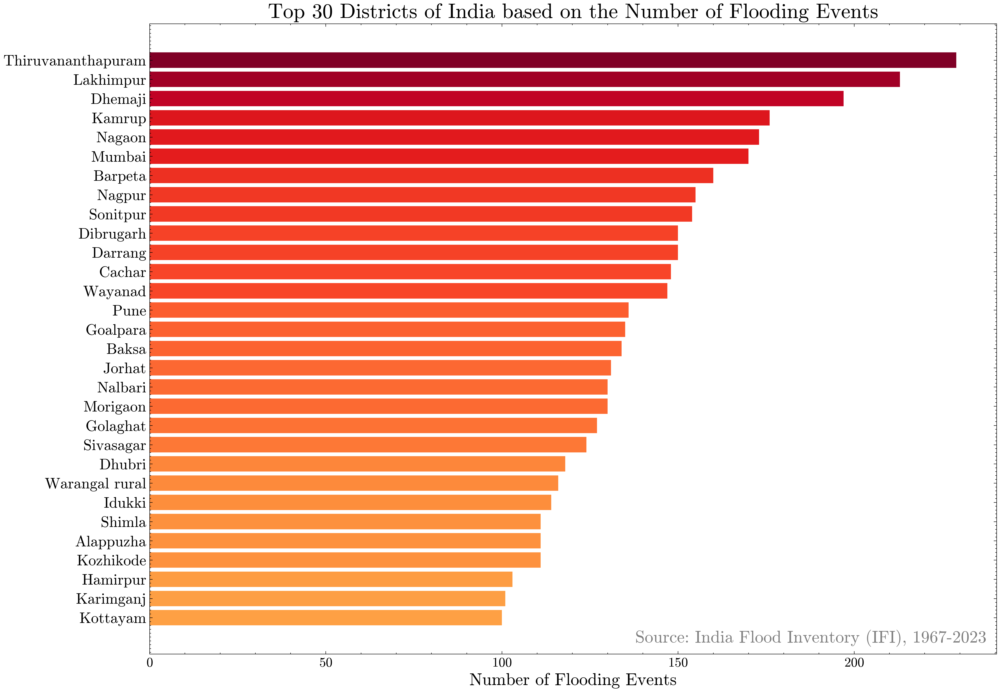

In [17]:
import matplotlib.pyplot as plt
import geopandas as gpd

district_df1 = district_df[0:30]
district_df1 = district_df1.sort_values(by='Count', ascending=True)
# Sort the GeoDataFrame by 'Count' in descending order to create the bar graph


# Extract state names and counts
dist_names = district_df1['Districts']
dist_names = dist_names.str.capitalize()
counts = district_df1['Count']

plt.figure(figsize=(16, 12),dpi=400, facecolor='white')
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(value / max(counts)) for value in counts]
bars = plt.barh(dist_names, counts, color=colors)
plt.xticks(fontsize=14)
plt.yticks(fontsize=16)

plt.xlabel('Number of Flooding Events',size=18)

#plt.ylabel('State')
plt.title('Top 30 Districts of India based on the Number of Flooding Events',size=22)
subtitle2 = 'Source: India Flood Inventory (IFI), 1967-2023'
plt.suptitle(subtitle2, fontsize=18, color='gray', y=0.14, x=0.73)
# Show the plot
plt.savefig('../output/Figures/District_Number_of_Flooding_Events_Bar.png',format = 'png', dpi=400)
plt.show()



In [18]:
FL_area= pd.read_csv("../Data/District_FloodedArea.csv")
DH = pd.read_csv("../Data/District_FloodImpact.csv")

In [19]:
dmap_df = gpd.read_file("../Data/shapefiles/district_shapefile/India_Districts.shp") 

In [20]:
dmap_df = dmap_df.to_crs(epsg=32643)
dmap_df['area'] = dmap_df['geometry'].area
dmap_df['FL_ar'] = FL_area.Corrected_Percent_Flooded_Area
dmap_df['flooded_area'] = dmap_df['area']*dmap_df['FL_ar']/100

In [21]:
dmerged = dmap_df.set_index('Dist_Name').join(district_df.set_index('Districts'))
dmerged['Count'] = dmerged['Count'].replace(np.nan, 0)
dmerged = dmerged.join(DH.set_index('Dist_Name'))
dmerged['Population'] = dmerged['Population']/1000000
dmerged['Count'] = dmerged['Count'].replace(np.nan, 0)
dmerged["Mean_Flood_Duration"] = dmerged["Mean_Flood_Duration"].replace(np.nan, 0)

/home/civil/phd/cez218606/anaconda3/envs/geo_env/lib/python3.10/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


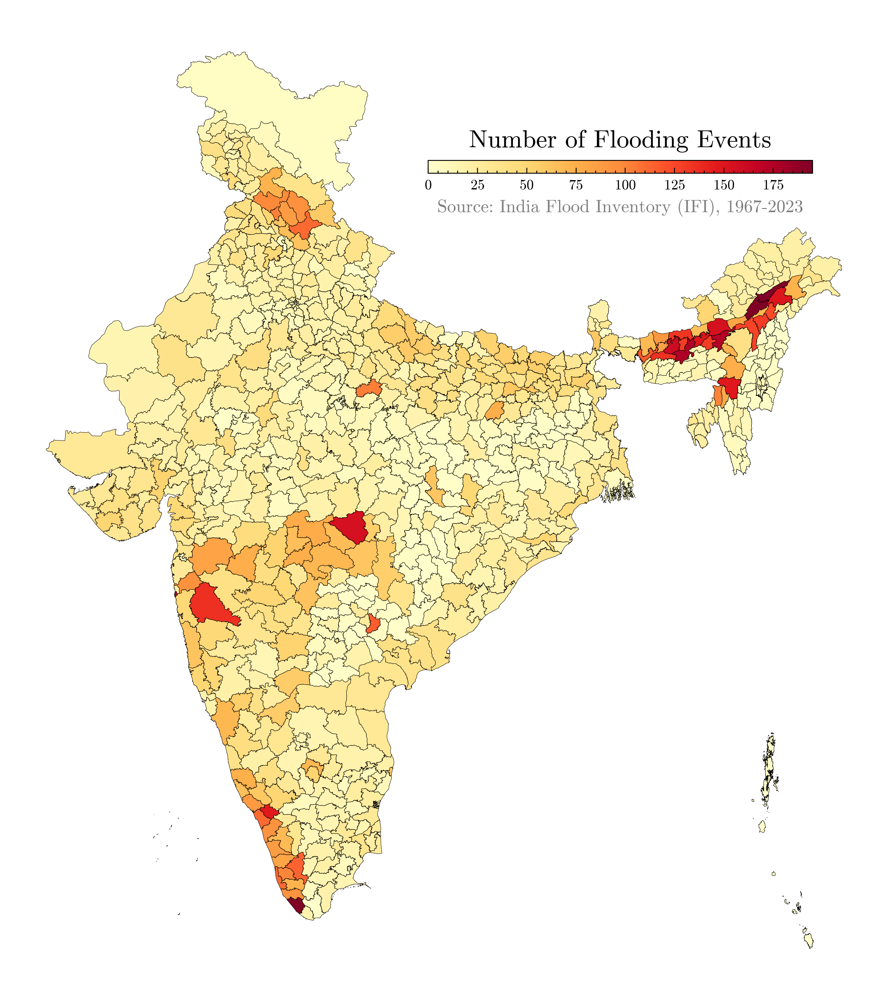

In [22]:
dfig, ax = plt.subplots(1, figsize=(10, 10),dpi=400, facecolor='white')
ax.axis('off')
#ax.set_title('India Flood Inventory [1967-2023]', fontdict={'fontsize': '20', 'fontweight' : '10'}, loc='left')

# rivers_shapefile_path = r"C:\Users\HP\Downloads\india_rivers\indRivers.shp"
# rivers_gdf = gpd.read_file(rivers_shapefile_path)

vmi =0
vma = 195

# Plot the figure
plot = dmerged.plot(column='Count',cmap='YlOrRd', linewidth=0.2, ax=ax, edgecolor='0', \
            legend=False,markersize=[39.739192, -104.990337],vmin=vmi, vmax=vma, legend_kwds={'label': "Number of Flooding Events"})

# rivers_gdf.plot(ax=ax, color='blue', linewidth=1)

cax = dfig.add_axes([0.5, 0.75, 0.3, 0.01])  # Adjust the coordinates and size as needed
sm = plt.cm.ScalarMappable(cmap='YlOrRd',norm=plt.Normalize(vmin=vmi, vmax=vma))
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label("Number of Flooding Events", labelpad = -35, size=14)

#subtitle1 = 'Figure Source: HydroSense Lab, IIT Delhi.'
subtitle2 = 'Source: India Flood Inventory (IFI), 1967-2023'

#plt.text(0.25, 0.12, subtitle1, fontsize=12, color='gray', transform=plt.gcf().transFigure)
plt.suptitle(subtitle2, fontsize=10, color='gray', y=0.73, x=0.65)

plt.savefig('../output/Figures/District_Number_of_Flooding_Events.png',format = 'png', dpi=400)
plt.show()


/home/civil/phd/cez218606/anaconda3/envs/geo_env/lib/python3.10/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


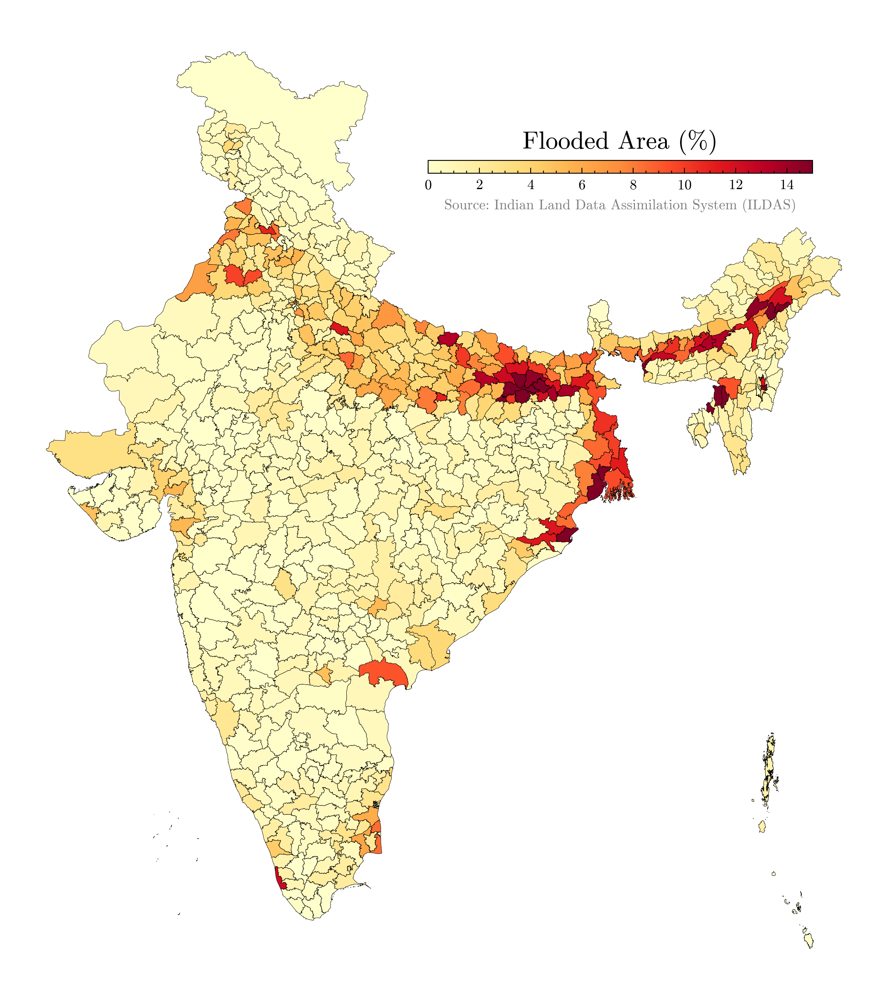

In [23]:
dfig, ax = plt.subplots(1, figsize=(10, 10),dpi=400, facecolor='white')
ax.axis('off')
#ax.set_title('India Flood Inventory [1967-2023]', fontdict={'fontsize': '20', 'fontweight' : '10'}, loc='left')

# rivers_shapefile_path = r"C:\Users\HP\Downloads\india_rivers\indRivers.shp"
# rivers_gdf = gpd.read_file(rivers_shapefile_path)

vmi =0
vma = 15

# Plot the figure
plot = dmerged.plot(column='FL_ar',cmap='YlOrRd', linewidth=0.2, ax=ax, edgecolor='0', \
            legend=False,markersize=[39.739192, -104.990337],vmin=vmi, vmax=vma, legend_kwds={'label': "Number of Flooding Events"})

# rivers_gdf.plot(ax=ax, color='blue', linewidth=1)

cax = dfig.add_axes([0.5, 0.75, 0.3, 0.01])  # Adjust the coordinates and size as needed
sm = plt.cm.ScalarMappable(cmap='YlOrRd',norm=plt.Normalize(vmin=vmi, vmax=vma))
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label("Flooded Area (%)", labelpad = -35, size=14)

#subtitle1 = 'Figure Source: HydroSense Lab, IIT Delhi.'
subtitle2 = 'Source: Indian Land Data Assimilation System (ILDAS)'

#plt.text(0.25, 0.12, subtitle1, fontsize=12, color='gray', transform=plt.gcf().transFigure)
plt.suptitle(subtitle2, fontsize=8, color='gray', y=0.73, x=0.65)

plt.savefig('../output/Figures/Flooded_Area.png',format = 'png', dpi=400)
plt.show()


/home/civil/phd/cez218606/anaconda3/envs/geo_env/lib/python3.10/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


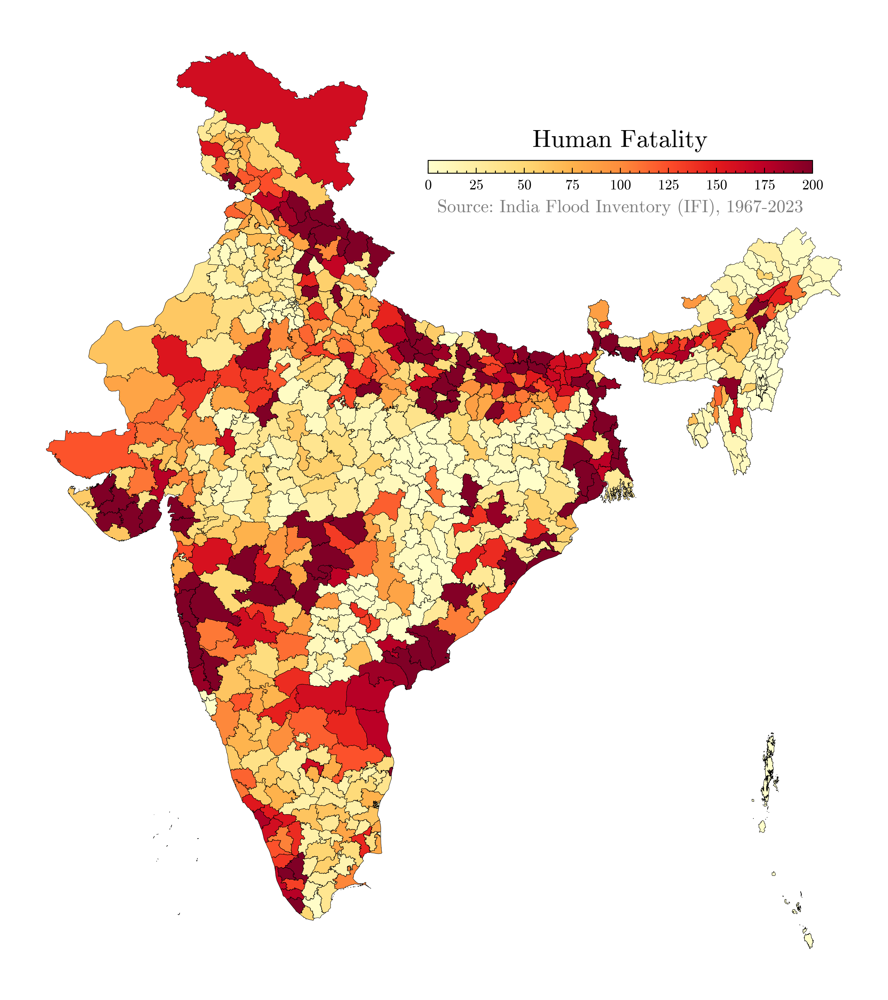

In [24]:
dfig, ax = plt.subplots(1, figsize=(10, 10),dpi=400, facecolor='white')
ax.axis('off')
#ax.set_title('India Flood Inventory [1967-2023]', fontdict={'fontsize': '20', 'fontweight' : '10'}, loc='left')

# rivers_shapefile_path = r"C:\Users\HP\Downloads\india_rivers\indRivers.shp"
# rivers_gdf = gpd.read_file(rivers_shapefile_path)

vmi =0
vma = 200

# Plot the figure
plot = dmerged.plot(column='Human_fatality',cmap='YlOrRd', linewidth=0.2, ax=ax, edgecolor='0', \
            legend=False,markersize=[39.739192, -104.990337],vmin=vmi, vmax=vma, legend_kwds={'label': "Number of Flooding Events"})

# rivers_gdf.plot(ax=ax, color='blue', linewidth=1)

cax = dfig.add_axes([0.5, 0.75, 0.3, 0.01])  # Adjust the coordinates and size as needed
sm = plt.cm.ScalarMappable(cmap='YlOrRd',norm=plt.Normalize(vmin=vmi, vmax=vma))
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label("Human Fatality", labelpad = -35, size=14)

#subtitle1 = 'Figure Source: HydroSense Lab, IIT Delhi.'
subtitle2 = 'Source: India Flood Inventory (IFI), 1967-2023'

#plt.text(0.25, 0.12, subtitle1, fontsize=12, color='gray', transform=plt.gcf().transFigure)
plt.suptitle(subtitle2, fontsize=10, color='gray', y=0.73, x=0.65)

plt.savefig('../output/Figures/Human_fatality.png',format = 'png', dpi=400)
plt.show()


/home/civil/phd/cez218606/anaconda3/envs/geo_env/lib/python3.10/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


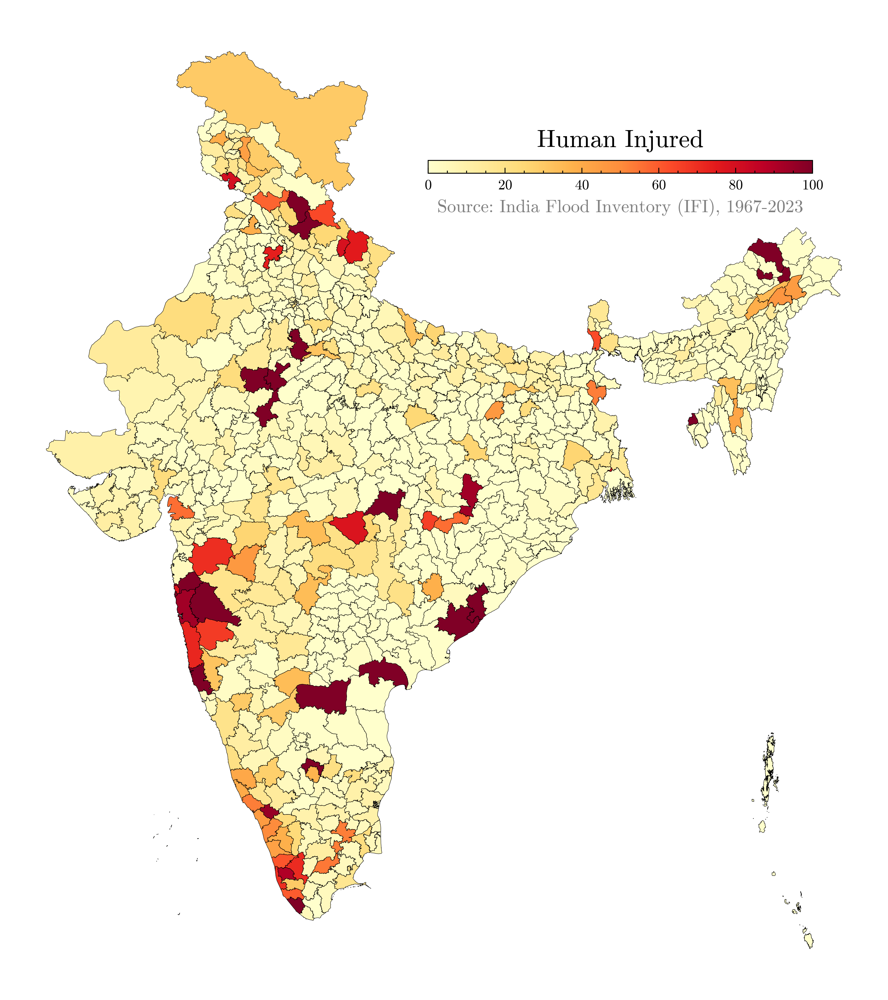

In [25]:
dfig, ax = plt.subplots(1, figsize=(10, 10),dpi=400, facecolor='white')
ax.axis('off')
#ax.set_title('India Flood Inventory [1967-2023]', fontdict={'fontsize': '20', 'fontweight' : '10'}, loc='left')

# rivers_shapefile_path = r"C:\Users\HP\Downloads\india_rivers\indRivers.shp"
# rivers_gdf = gpd.read_file(rivers_shapefile_path)

vmi =0
vma = 100

# Plot the figure
plot = dmerged.plot(column='Human_injured',cmap='YlOrRd', linewidth=0.2, ax=ax, edgecolor='0', \
            legend=False,markersize=[39.739192, -104.990337],vmin=vmi, vmax=vma, legend_kwds={'label': "Number of Flooding Events"})

# rivers_gdf.plot(ax=ax, color='blue', linewidth=1)

cax = dfig.add_axes([0.5, 0.75, 0.3, 0.01])  # Adjust the coordinates and size as needed
sm = plt.cm.ScalarMappable(cmap='YlOrRd',norm=plt.Normalize(vmin=vmi, vmax=vma))
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label("Human Injured", labelpad = -35, size=14)

#subtitle1 = 'Figure Source: HydroSense Lab, IIT Delhi.'
subtitle2 = 'Source: India Flood Inventory (IFI), 1967-2023'

#plt.text(0.25, 0.12, subtitle1, fontsize=12, color='gray', transform=plt.gcf().transFigure)
plt.suptitle(subtitle2, fontsize=10, color='gray', y=0.73, x=0.65)

plt.savefig('../output/Figures/Human_injured.png',format = 'png', dpi=400)
plt.show()


/home/civil/phd/cez218606/anaconda3/envs/geo_env/lib/python3.10/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


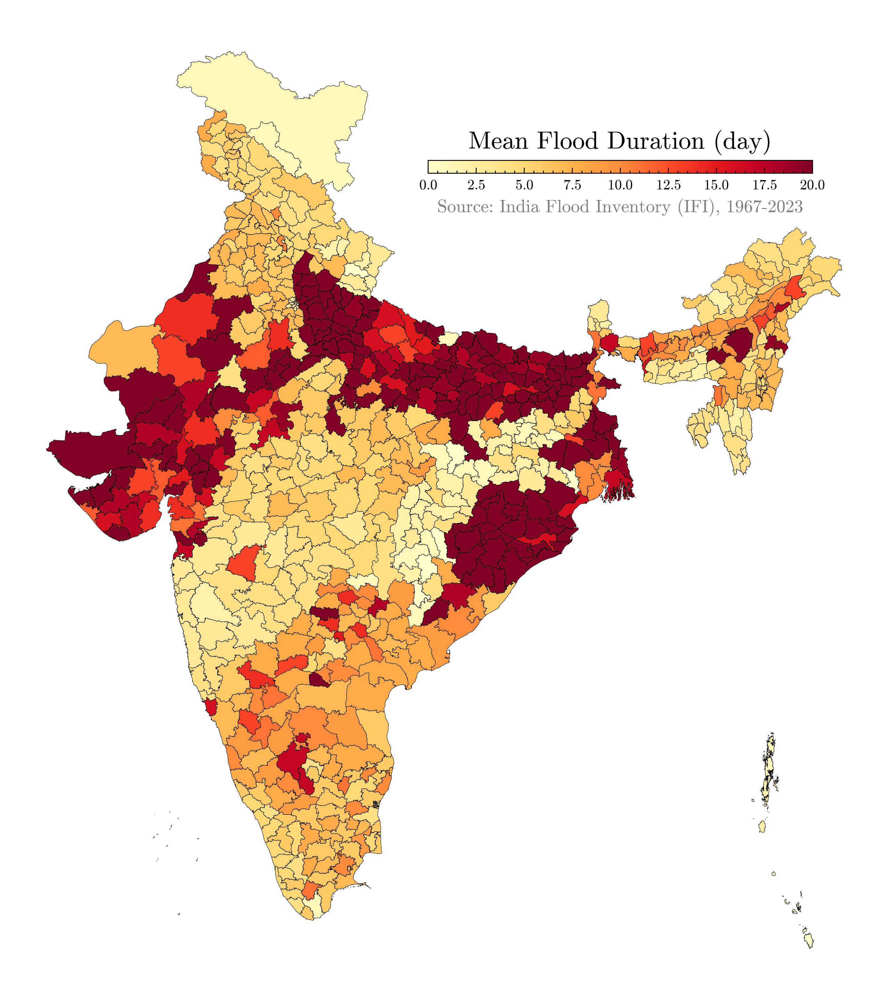

In [26]:
dfig, ax = plt.subplots(1, figsize=(10, 10),dpi=400, facecolor='white')
ax.axis('off')
#ax.set_title('India Flood Inventory [1967-2023]', fontdict={'fontsize': '20', 'fontweight' : '10'}, loc='left')

# rivers_shapefile_path = r"C:\Users\HP\Downloads\india_rivers\indRivers.shp"
# rivers_gdf = gpd.read_file(rivers_shapefile_path)

vmi =0
vma = 20

# Plot the figure
plot = dmerged.plot(column='Mean_Flood_Duration',cmap='YlOrRd', linewidth=0.2, ax=ax, edgecolor='0', \
            legend=False,markersize=[39.739192, -104.990337],vmin=vmi, vmax=vma, legend_kwds={'label': "Number of Flooding Events"})

# rivers_gdf.plot(ax=ax, color='blue', linewidth=1)

cax = dfig.add_axes([0.5, 0.75, 0.3, 0.01])  # Adjust the coordinates and size as needed
sm = plt.cm.ScalarMappable(cmap='YlOrRd',norm=plt.Normalize(vmin=vmi, vmax=vma))
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label("Mean Flood Duration (day)", labelpad = -35, size=14)

#subtitle1 = 'Figure Source: HydroSense Lab, IIT Delhi.'
subtitle2 = 'Source: India Flood Inventory (IFI), 1967-2023'

#plt.text(0.25, 0.12, subtitle1, fontsize=12, color='gray', transform=plt.gcf().transFigure)
plt.suptitle(subtitle2, fontsize=10, color='gray', y=0.73, x=0.65)

plt.savefig('../output/Figures/Mean_Flood_Duration.png',format = 'png', dpi=400)
plt.show()


/home/civil/phd/cez218606/anaconda3/envs/geo_env/lib/python3.10/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


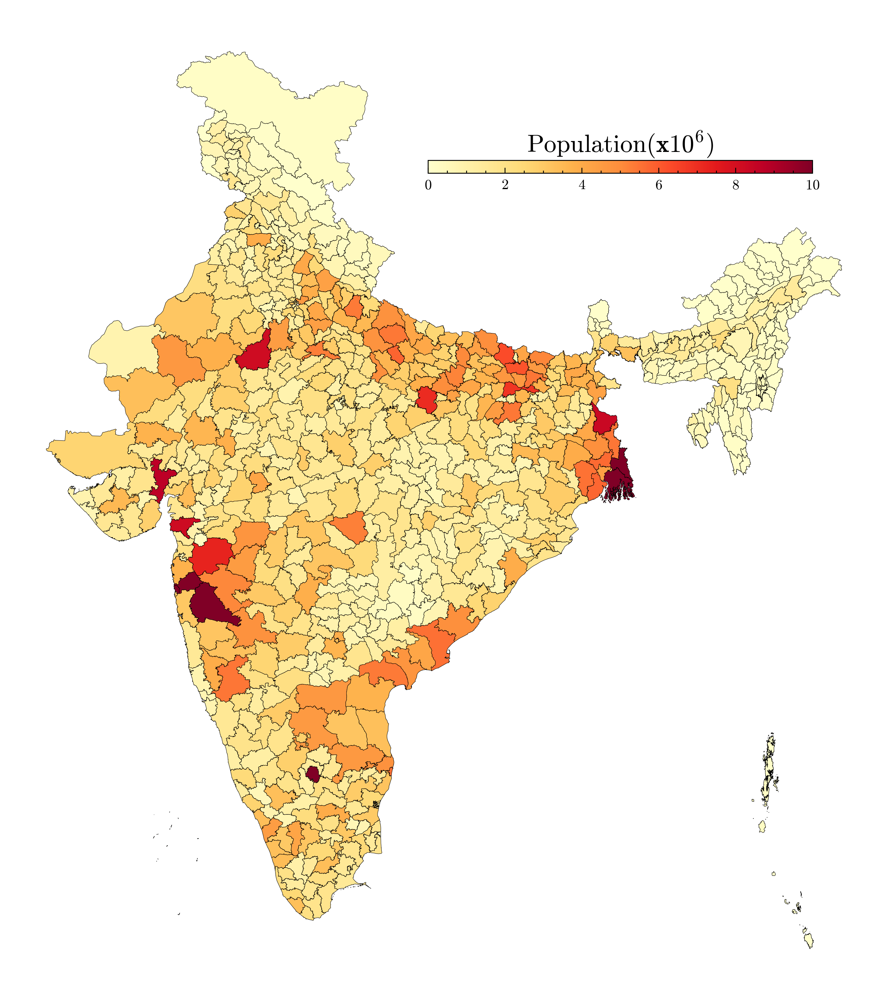

In [27]:
dfig, ax = plt.subplots(1, figsize=(10, 10),dpi=400, facecolor='white')
ax.axis('off')
#ax.set_title('India Flood Inventory [1967-2023]', fontdict={'fontsize': '20', 'fontweight' : '10'}, loc='left')

# rivers_shapefile_path = r"C:\Users\HP\Downloads\india_rivers\indRivers.shp"
# rivers_gdf = gpd.read_file(rivers_shapefile_path)

vmi =0
vma = 10

# Plot the figure
plot = dmerged.plot(column='Population',cmap='YlOrRd', linewidth=0.2, ax=ax, edgecolor='0', \
            legend=False,markersize=[39.739192, -104.990337],vmin=vmi, vmax=vma, legend_kwds={'label': "Number of Flooding Events"})

# rivers_gdf.plot(ax=ax, color='blue', linewidth=1)

cax = dfig.add_axes([0.5, 0.75, 0.3, 0.01])  # Adjust the coordinates and size as needed
sm = plt.cm.ScalarMappable(cmap='YlOrRd',norm=plt.Normalize(vmin=vmi, vmax=vma))
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label("Population($\mathbf{x10^6}$)", labelpad = -35, size=14)

#subtitle1 = 'Figure Source: HydroSense Lab, IIT Delhi.'
#subtitle2 = 'Source: Facebook Population Data, 1967-2023'

#plt.text(0.25, 0.12, subtitle1, fontsize=12, color='gray', transform=plt.gcf().transFigure)
#plt.suptitle(subtitle2, fontsize=10, color='gray', y=0.73, x=0.65)

plt.savefig('../output/Figures/Population.png',format = 'png', dpi=400)
plt.show()


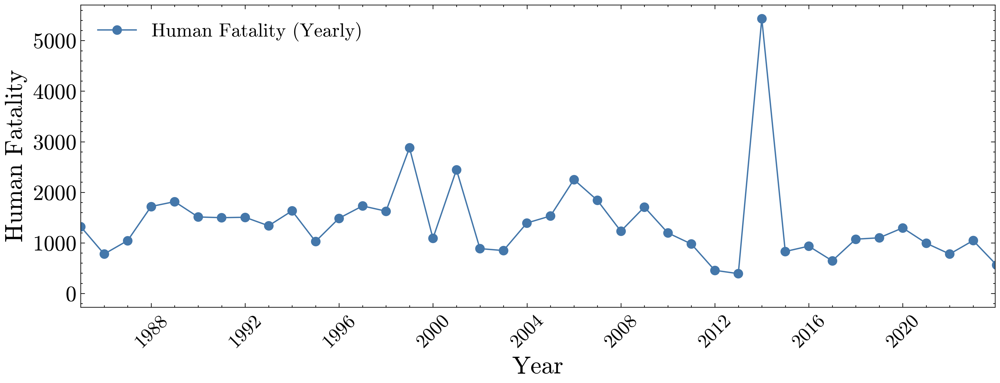

In [28]:
# Replace NaN values in 'Human fatality' column with 0
df['Human fatality'].fillna(0, inplace=True)

# Convert 'Human fatality' to numeric, replacing non-numeric values with NaN
df['Human fatality'] = pd.to_numeric(df['Human fatality'], errors='coerce')

df['Year'] = df.index.year  # Create a new column for the year

# Group by year and sum the human fatality for each year
df_yearly = df.groupby(pd.Grouper(freq='Y'))['Human fatality'].sum()

plt.figure(figsize=(12,4),dpi=400, facecolor='white')

plt.xlim(pd.Timestamp('1985-01-01'), df.index.max())

plt.plot(np.array(df_yearly.index), np.array(df_yearly), label='Human Fatality (Yearly)     ', marker='o')

#plt.title('Human Fatality (Time Series)', fontsize=22)
plt.xlabel('Year', fontsize=18)
plt.ylabel('Human Fatality', fontsize=18)
plt.legend(fontsize=14)
plt.xticks(fontsize=14,rotation=45)
plt.yticks(fontsize=16)

plt.savefig('../output/Figures/Human_Fatality_yearly.png',format = 'png', dpi=400)
plt.show()


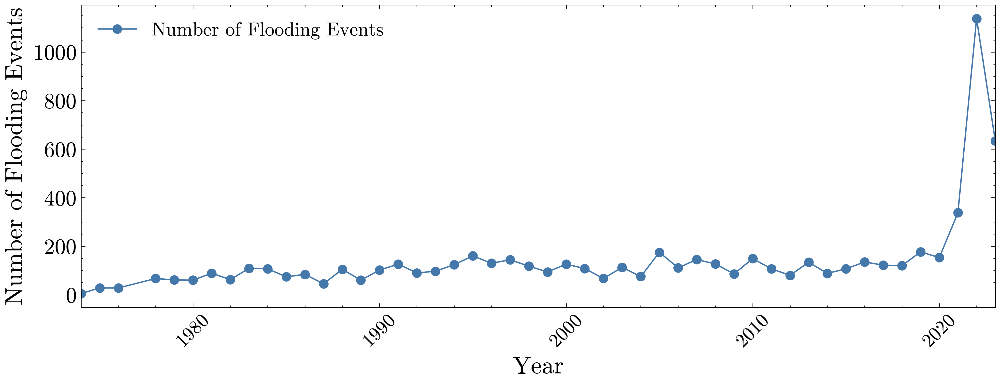

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'Year' is a column in your DataFrame df, and it's in datetime format
df['Year'] = df.index.year  # Create a new column for the year

# Group by year and count the occurrences of each year
df_yearly = df.groupby('Year').size()

plt.figure(figsize=(12, 4), dpi=400, facecolor='white')

# Setting x-axis limits from the earliest year in the data to the maximum year
plt.xlim(df.index.min().year, df.index.max().year)

# Plotting the data
plt.plot(df_yearly.index, df_yearly, label='Number of Flooding Events', marker='o')

# Adding labels and legend
plt.xlabel('Year', fontsize=18)
plt.ylabel('Number of Flooding Events', fontsize=18)
plt.legend(fontsize=14)

# Adjusting tick font sizes and rotation
plt.xticks(fontsize=14, rotation=45)
plt.yticks(fontsize=16)

plt.savefig('../output/Figures/Number_of_Flooding_Events_yearly.png',format = 'png', dpi=400)
plt.show()


In [30]:
dmerged['DFSI'] = np.log10(((1+dmerged['Count']) *(1+dmerged['Mean_Flood_Duration']) *(1+dmerged['Human_fatality'])**(2)*(1+dmerged['Human_injured'])*((1+dmerged['flooded_area'])*(dmerged['Population']))).replace(0, np.nan))


In [31]:
dmerged['DFSI'].min()

4.244484579746598

In [32]:
dmerged['DFSI'].max()

19.300564104042074

/home/civil/phd/cez218606/anaconda3/envs/geo_env/lib/python3.10/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


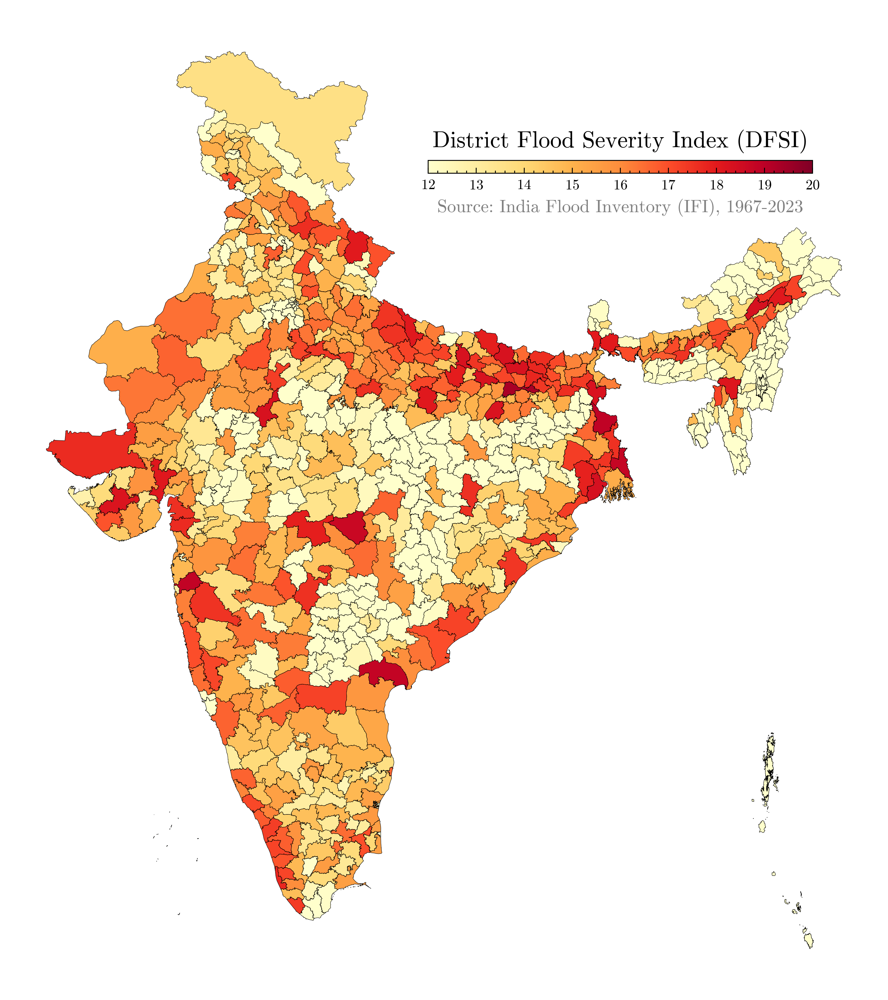

In [33]:
dfig, ax = plt.subplots(1, figsize=(10, 10), dpi=400, facecolor='white')
ax.axis('off')
#ax.set_title('India Flood Inventory [1967-2023]', fontdict={'fontsize': '22', 'fontweight' : '10'}, loc='left')

vmi = 12
vma = 20

# Plot the figure
plot = dmerged.plot(column='DFSI',cmap='YlOrRd', linewidth=0.2, ax=ax, edgecolor='0', \
            legend=False,markersize=[39.739192, -104.990337], vmin=vmi, vmax=vma,legend_kwds={'label': "DFSI"})

# rivers_gdf.plot(ax=ax, color='blue', linewidth=1)

cax = dfig.add_axes([0.5, 0.75, 0.3, 0.01])  # Adjust the coordinates and size as needed
sm = plt.cm.ScalarMappable(cmap='YlOrRd',norm=plt.Normalize(vmin=vmi, vmax=vma))
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')

cbar.set_label("District Flood Severity Index (DFSI)", labelpad = -35, size=13)

#subtitle1 = 'Figure Source: HydroSense Lab, IIT Delhi.'
subtitle2 = 'Source: India Flood Inventory (IFI), 1967-2023'

#plt.text(0.25, 0.12, subtitle1, fontsize=12, color='gray', transform=plt.gcf().transFigure)
plt.suptitle(subtitle2, fontsize=10, color='gray', y=0.73, x=0.65)

plt.savefig('../output/Figures/DFSI.png',format = 'png', dpi=400)
plt.show()

In [34]:
sorted_dmerged = dmerged.sort_values(by='DFSI', ascending=False)

In [35]:
aa = sorted_dmerged[['State_Name', 'DFSI']]

In [36]:
aa.to_csv('../output/DFSI.csv')